In [1]:
# %tensorflow_version 1.x

copy from https://keras.io/examples/generative/wgan_gp/

In [2]:
import numpy as np
import matplotlib.pyplot as plt

import tensorflow as tf
from tensorflow import keras
from tensorflow.keras.layers import *

# 데이터 준비

In [85]:
IMG_SHAPE = (28, 28, 1)
BATCH_SIZE = 512

# Size of noise vector
noise_dim = 128

fashion_mnist = keras.datasets.fashion_mnist
# (train_images, train_labels), (test_images, test_labels) = fashion_mnist.load_data()
(train_images, train_labels), (test_images, test_labels) = tf.keras.datasets.mnist.load_data()
print(f"Number of examples: {len(train_images)}")
print(f"Shape of the images in the dataset: {train_images.shape[1:]}")

# we will reshape each sample to (28, 28, 1) and normalize the pixel values in [-1, 1].
train_images = train_images.reshape(train_images.shape[0], *IMG_SHAPE).astype("float32")
train_images = (train_images - 127.5) / 127.5

test_images = test_images.reshape(test_images.shape[0], *IMG_SHAPE).astype("float32")
test_images = (test_images - 127.5) / 127.5


Number of examples: 60000
Shape of the images in the dataset: (28, 28)


In [4]:
print(train_images.shape)
print(np.min(train_images), np.max(train_images))

(60000, 28, 28, 1)
-1.0 1.0


# GAN D 학습

## D 정의

In [5]:

def conv_block(
    x,
    filters,
    kernel_size=(3, 3),
    strides=(1, 1),
    padding="same",
    use_bias=True,
    activation=LeakyReLU(0.2),
    use_bn=False,
    use_dropout=False,
    drop_value=0.3,
):
    x = Conv2D(filters, kernel_size, strides=strides, padding=padding, use_bias=use_bias)(x)
    if use_bn:
        x = BatchNormalization()(x)
    x = activation(x)
    if use_dropout:
        x = Dropout(drop_value)(x)
    return x


def get_discriminator_model():
    img_input = Input(shape=IMG_SHAPE)
    # 사이즈를 (32, 32, 1)로 맞추어 주려고 zero padding을 함.
    x = ZeroPadding2D((2, 2))(img_input)
    x = conv_block(x, 64, (5,5), strides=(2,2), activation=LeakyReLU(0.2))
    x = conv_block(x, 128, (5,5), strides=(2,2), activation=LeakyReLU(0.2), use_dropout=True, drop_value=0.3)
    x = conv_block(x, 256, (5,5), strides=(2,2), activation=LeakyReLU(0.2), use_dropout=True, drop_value=0.3)
    x = conv_block(x, 512, (5,5), strides=(2,2), activation=LeakyReLU(0.2))
    x = Flatten()(x)
    x = Dropout(0.2)(x)
    x = Dense(1)(x)

    d_model = keras.models.Model(img_input, x, name="discriminator")
    return d_model


d_model = get_discriminator_model()
d_model.summary()


Model: "discriminator"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
input_1 (InputLayer)         [(None, 28, 28, 1)]       0         
_________________________________________________________________
zero_padding2d (ZeroPadding2 (None, 32, 32, 1)         0         
_________________________________________________________________
conv2d (Conv2D)              (None, 16, 16, 64)        1664      
_________________________________________________________________
leaky_re_lu_1 (LeakyReLU)    (None, 16, 16, 64)        0         
_________________________________________________________________
conv2d_1 (Conv2D)            (None, 8, 8, 128)         204928    
_________________________________________________________________
leaky_re_lu_2 (LeakyReLU)    (None, 8, 8, 128)         0         
_________________________________________________________________
dropout (Dropout)            (None, 8, 8, 128)       

## G 정의

In [6]:

def upsample_block(
    x,
    filters,
    kernel_size=(3, 3),
    strides=(1, 1),
    up_size=(2, 2),
    padding="same",
    use_bias=False,
    use_bn=True,
    activation=LeakyReLU(0.2),
    use_dropout=False,
    drop_value=0.3,
):
    x = UpSampling2D(up_size)(x)
    x = Conv2D(filters, kernel_size, strides=strides, padding=padding, use_bias=use_bias)(x)

    if use_bn:
        x = BatchNormalization()(x)

    if activation:
        x = activation(x)
    if use_dropout:
        x = Dropout(drop_value)(x)
    return x


def get_generator_model():
    noise = Input(shape=(noise_dim,))
    x = Dense(4 * 4 * 256, use_bias=False)(noise)
    x = BatchNormalization()(x)
    x = LeakyReLU(0.2)(x)

    x = Reshape((4, 4, 256))(x)
    x = upsample_block(x, 128, (3, 3), activation=LeakyReLU(0.2))
    x = upsample_block(x, 64, (3, 3), activation=LeakyReLU(0.2))
    x = upsample_block(x, 1, (3, 3), activation=Activation("tanh"))

    # At this point, we have an output which has the same shape as the input, (32, 32, 1).
    # We will use a Cropping2D layer to make it (28, 28, 1).
    x = Cropping2D((2, 2))(x)

    g_model = keras.models.Model(noise, x, name="generator")
    return g_model


g_model = get_generator_model()
g_model.summary()


Model: "generator"
__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
input_2 (InputLayer)            [(None, 128)]        0                                            
__________________________________________________________________________________________________
dense_1 (Dense)                 (None, 4096)         524288      input_2[0][0]                    
__________________________________________________________________________________________________
batch_normalization (BatchNorma (None, 4096)         16384       dense_1[0][0]                    
__________________________________________________________________________________________________
leaky_re_lu_6 (LeakyReLU)       (None, 4096)         0           batch_normalization[0][0]        
__________________________________________________________________________________________

## GAN 전체 모델 정의

In [7]:
class WGAN(keras.Model):
    def __init__(
        self,
        discriminator,
        generator,
        latent_dim,
        discriminator_extra_steps=3,
        gp_weight=10.0,
    ):
        super(WGAN, self).__init__()
        self.discriminator = discriminator
        self.generator = generator
        self.latent_dim = latent_dim
        self.d_steps = discriminator_extra_steps
        self.gp_weight = gp_weight

    def compile(self, d_optimizer, g_optimizer, d_loss_fn, g_loss_fn):
        super(WGAN, self).compile()
        self.d_optimizer = d_optimizer
        self.g_optimizer = g_optimizer
        self.d_loss_fn = d_loss_fn
        self.g_loss_fn = g_loss_fn

    def gradient_penalty(self, batch_size, real_images, fake_images):
        """ Calculates the gradient penalty.

        This loss is calculated on an interpolated image
        and added to the discriminator loss.
        """
        # get the interplated image
        alpha = tf.random.normal([batch_size, 1, 1, 1], 0.0, 1.0)
        diff = fake_images - real_images
        interpolated = real_images + alpha * diff

        with tf.GradientTape() as gp_tape:
            gp_tape.watch(interpolated)
            # 1. Get the discriminator output for this interpolated image.
            pred = self.discriminator(interpolated, training=True)

        # 2. Calculate the gradients w.r.t to this interpolated image.
        grads = gp_tape.gradient(pred, [interpolated])[0]
        # 3. Calcuate the norm of the gradients
        norm = tf.sqrt(tf.reduce_sum(tf.square(grads), axis=[1, 2, 3]))
        gp = tf.reduce_mean((norm - 1.0) ** 2)
        return gp

    def train_step(self, real_images):
        if isinstance(real_images, tuple):
            real_images = real_images[0]

        batch_size = tf.shape(real_images)[0]

        # D는 G에 비해 여러번 학습
        for i in range(self.d_steps):

            # D 한번 학습
            random_latent_vectors = tf.random.normal(shape=(batch_size, self.latent_dim))
            with tf.GradientTape() as tape:
                fake_images = self.generator(random_latent_vectors, training=True)
                fake_logits = self.discriminator(fake_images, training=True)
                real_logits = self.discriminator(real_images, training=True)

                d_cost = self.d_loss_fn(real_img=real_logits, fake_img=fake_logits)
                gp = self.gradient_penalty(batch_size, real_images, fake_images)
                d_loss = d_cost + gp * self.gp_weight

            d_gradient = tape.gradient(d_loss, self.discriminator.trainable_variables)
            self.d_optimizer.apply_gradients(zip(d_gradient, self.discriminator.trainable_variables))

        # G 한번 학습
        random_latent_vectors = tf.random.normal(shape=(batch_size, self.latent_dim))
        with tf.GradientTape() as tape:
            generated_images = self.generator(random_latent_vectors, training=True)
            gen_img_logits = self.discriminator(generated_images, training=True)
            g_loss = self.g_loss_fn(gen_img_logits)

        gen_gradient = tape.gradient(g_loss, self.generator.trainable_variables)
        self.g_optimizer.apply_gradients(zip(gen_gradient, self.generator.trainable_variables))
        
        return {"d_loss": d_loss, "g_loss": g_loss}

        

## callback 정의


In [8]:
import math

def show_images(images):
    n = int(math.sqrt(len(images)))
    size = images[0].shape[0]
    figure = np.zeros((size * n, size * n, 3))

    for i in range(n):
        for j in range(n):
            figure[i*size : (i+1)*size,
                   j*size : (j+1)*size] = images[i*n+j]
    figure = (figure + 1) / 2 * 255
    figure = np.round(figure, 0).astype('uint8')
    plt.imshow(figure)
    plt.show()


class GANMonitor(keras.callbacks.Callback):
    def __init__(self, num_img=81, latent_dim=noise_dim):
        self.num_img = num_img
        self.latent_dim = latent_dim

    def on_epoch_end(self, epoch, logs=None):
        random_latent_vectors = tf.random.normal(shape=(self.num_img, self.latent_dim))
        generated_images = self.model.generator(random_latent_vectors)
        show_images(generated_images)


## 학습


Epoch 1/20
118/118 [==============================] - ETA: 0s - d_loss: -16.4282 - g_loss: -17.4549

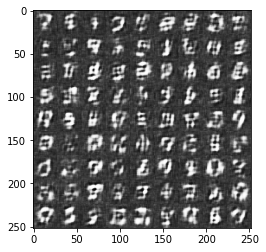

118/118 [==============================] - 162s 1s/step - d_loss: -16.4133 - g_loss: -17.3678
Epoch 2/20
118/118 [==============================] - ETA: 0s - d_loss: -14.8450 - g_loss: -6.3151

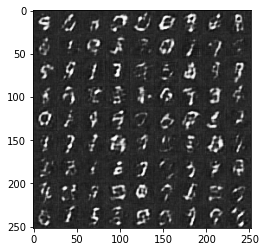

118/118 [==============================] - 162s 1s/step - d_loss: -14.8481 - g_loss: -6.2490
Epoch 3/20
118/118 [==============================] - ETA: 0s - d_loss: -13.5062 - g_loss: -0.3018

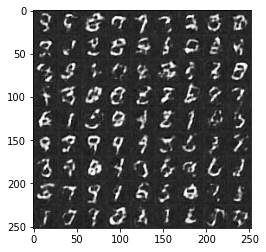

118/118 [==============================] - 162s 1s/step - d_loss: -13.5073 - g_loss: -0.3191
Epoch 4/20
118/118 [==============================] - ETA: 0s - d_loss: -12.4062 - g_loss: 0.6801

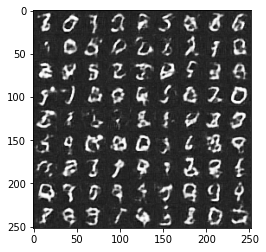

118/118 [==============================] - 162s 1s/step - d_loss: -12.4094 - g_loss: 0.7065
Epoch 5/20
118/118 [==============================] - ETA: 0s - d_loss: -11.3603 - g_loss: 5.1209

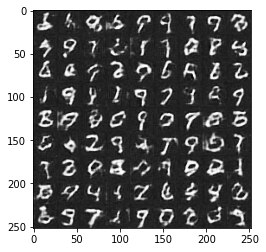

118/118 [==============================] - 162s 1s/step - d_loss: -11.3580 - g_loss: 5.1544
Epoch 6/20
118/118 [==============================] - ETA: 0s - d_loss: -10.4423 - g_loss: 9.8227

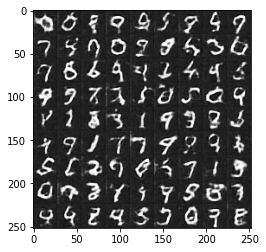

118/118 [==============================] - 163s 1s/step - d_loss: -10.4436 - g_loss: 9.8212
Epoch 7/20
118/118 [==============================] - ETA: 0s - d_loss: -9.6271 - g_loss: 11.1478

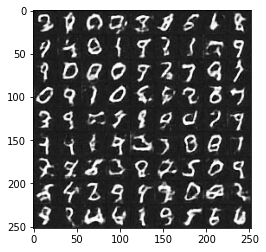

118/118 [==============================] - 163s 1s/step - d_loss: -9.6230 - g_loss: 11.1554
Epoch 8/20
118/118 [==============================] - ETA: 0s - d_loss: -8.9049 - g_loss: 12.8105

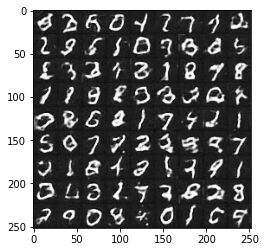

118/118 [==============================] - 162s 1s/step - d_loss: -8.9054 - g_loss: 12.7945
Epoch 9/20
118/118 [==============================] - ETA: 0s - d_loss: -8.1740 - g_loss: 13.3084

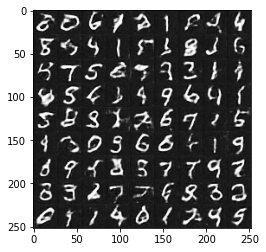

118/118 [==============================] - 162s 1s/step - d_loss: -8.1611 - g_loss: 13.3235
Epoch 10/20
118/118 [==============================] - ETA: 0s - d_loss: -7.5467 - g_loss: 14.6311

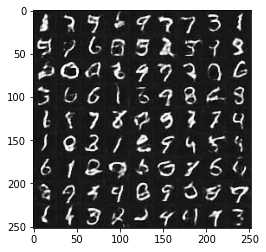

118/118 [==============================] - 162s 1s/step - d_loss: -7.5459 - g_loss: 14.6197
Epoch 11/20
118/118 [==============================] - ETA: 0s - d_loss: -6.9723 - g_loss: 13.5187

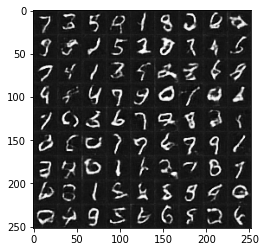

118/118 [==============================] - 162s 1s/step - d_loss: -6.9684 - g_loss: 13.5412
Epoch 12/20
118/118 [==============================] - ETA: 0s - d_loss: -6.4910 - g_loss: 13.2110

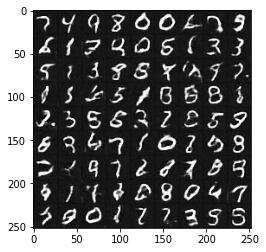

118/118 [==============================] - 162s 1s/step - d_loss: -6.4885 - g_loss: 13.1885
Epoch 13/20
118/118 [==============================] - ETA: 0s - d_loss: -6.0051 - g_loss: 10.9753

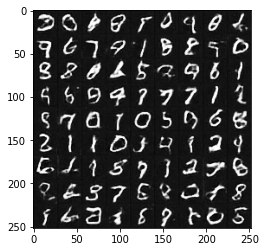

118/118 [==============================] - 162s 1s/step - d_loss: -6.0007 - g_loss: 10.9688
Epoch 14/20
118/118 [==============================] - ETA: 0s - d_loss: -5.6212 - g_loss: 10.2547

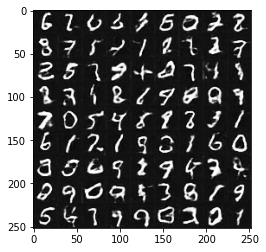

118/118 [==============================] - 162s 1s/step - d_loss: -5.6207 - g_loss: 10.2598
Epoch 15/20
118/118 [==============================] - ETA: 0s - d_loss: -5.1930 - g_loss: 10.7193

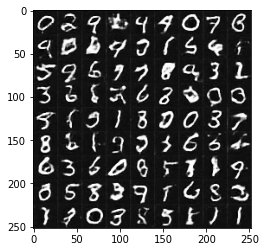

118/118 [==============================] - 162s 1s/step - d_loss: -5.1898 - g_loss: 10.7306
Epoch 16/20
118/118 [==============================] - ETA: 0s - d_loss: -4.8334 - g_loss: 11.8940

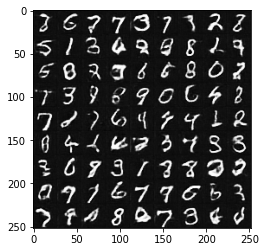

118/118 [==============================] - 162s 1s/step - d_loss: -4.8435 - g_loss: 11.8636
Epoch 17/20
118/118 [==============================] - ETA: 0s - d_loss: -4.5331 - g_loss: 11.4386

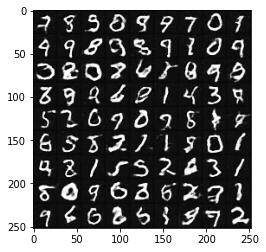

118/118 [==============================] - 162s 1s/step - d_loss: -4.5319 - g_loss: 11.3918
Epoch 18/20
118/118 [==============================] - ETA: 0s - d_loss: -4.2015 - g_loss: 12.2505

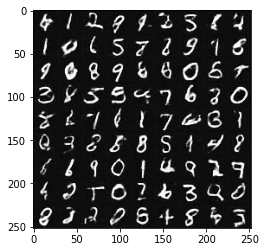

118/118 [==============================] - 163s 1s/step - d_loss: -4.2102 - g_loss: 12.2591
Epoch 19/20
118/118 [==============================] - ETA: 0s - d_loss: -3.8909 - g_loss: 12.5732

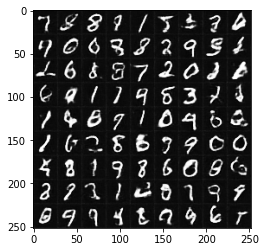

118/118 [==============================] - 162s 1s/step - d_loss: -3.8984 - g_loss: 12.5992
Epoch 20/20
118/118 [==============================] - ETA: 0s - d_loss: -3.6642 - g_loss: 14.4330

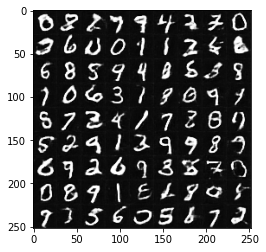

118/118 [==============================] - 163s 1s/step - d_loss: -3.6620 - g_loss: 14.4217


In [9]:
generator_optimizer = keras.optimizers.Adam(learning_rate=0.0002, beta_1=0.5, beta_2=0.9)
discriminator_optimizer = keras.optimizers.Adam(learning_rate=0.0002, beta_1=0.5, beta_2=0.9)

def discriminator_loss(real_img, fake_img):
    real_loss = tf.reduce_mean(real_img) # real : 1
    fake_loss = tf.reduce_mean(fake_img) # fake : 0
    return fake_loss - real_loss


def generator_loss(d_output):
    return -tf.reduce_mean(d_output)


epochs = 20


# Get the wgan model
wgan = WGAN(
    discriminator=d_model,
    generator=g_model,
    latent_dim=noise_dim,
    discriminator_extra_steps=3,
)

# Compile the wgan model
wgan.compile(
    d_optimizer=discriminator_optimizer,
    g_optimizer=generator_optimizer,
    g_loss_fn=generator_loss,
    d_loss_fn=discriminator_loss,
)

monitor_callback = GANMonitor(num_img=81, latent_dim=noise_dim)

# Start training
wgan.fit(train_images, batch_size=BATCH_SIZE, epochs=epochs, callbacks=[monitor_callback])


In [10]:
g_model.save("g_model.h5")
d_model.save("d_model.h5")

# AutoEncoder with GAN D

## AutoEncoder 정의

In [38]:

def get_autoencoder_model():

    img_input = Input(shape=IMG_SHAPE)
    x = ZeroPadding2D((2, 2))(img_input)
    x = conv_block(x, 64, (5,5), strides=(2,2), activation=LeakyReLU(0.2))
    x = conv_block(x, 128, (5,5), strides=(2,2), activation=LeakyReLU(0.2), use_dropout=True, drop_value=0.3)
    x = conv_block(x, 256, (5,5), strides=(2,2), activation=LeakyReLU(0.2), use_dropout=True, drop_value=0.3)
    x = Flatten()(x)


    x = Dense(256, use_bias=False)(x)
    x = BatchNormalization()(x)
    x = LeakyReLU(0.2)(x)

    x = Dense(4*4*256, use_bias=False)(x)


    x = Reshape((4, 4, 256))(x)
    x = upsample_block(x, 256, (3, 3), activation=LeakyReLU(0.2))
    x = upsample_block(x, 128, (3, 3), activation=LeakyReLU(0.2))
    x = upsample_block(x, 1, (3, 3), activation=Activation("tanh"))

    # 사방 2개씩 padding한거 잘라낸다.
    x = Cropping2D((2, 2))(x)

    model = keras.models.Model(img_input, x, name="autoencoder")
    return model


ae_model = get_autoencoder_model()
ae_model.summary()

Model: "autoencoder"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
input_13 (InputLayer)        [(None, 28, 28, 1)]       0         
_________________________________________________________________
zero_padding2d_11 (ZeroPaddi (None, 32, 32, 1)         0         
_________________________________________________________________
conv2d_65 (Conv2D)           (None, 16, 16, 64)        1664      
_________________________________________________________________
leaky_re_lu_64 (LeakyReLU)   (None, 16, 16, 64)        0         
_________________________________________________________________
conv2d_66 (Conv2D)           (None, 8, 8, 128)         204928    
_________________________________________________________________
leaky_re_lu_65 (LeakyReLU)   (None, 8, 8, 128)         0         
_________________________________________________________________
dropout_27 (Dropout)         (None, 8, 8, 128)         

## callbacks 정의

In [90]:
import math

def show_images(images):
    n = int(math.sqrt(len(images)))
    size = images[0].shape[0]
    figure = np.zeros((size * n, size * n, 3))

    for i in range(n):
        for j in range(n):
            figure[i*size : (i+1)*size,
                   j*size : (j+1)*size] = images[i*n+j]
    figure = (figure + 1) / 2 * 255
    figure = np.round(figure, 0).astype('uint8')
    plt.imshow(figure)
    plt.show()


class IadMonitor(keras.callbacks.Callback):
    def __init__(self, num_img, test_images):
        self.num_img = num_img
        self.test_images=test_images

    def on_epoch_end(self, epoch, logs=None):
        generated_images = self.model.predict(self.test_images[:self.num_img])
        show_images(generated_images)


## 모델 학습

Epoch 1/100
117/118 [============================>.] - ETA: 0s - loss: -10.1568

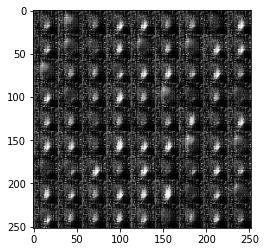

118/118 [==============================] - 14s 115ms/step - loss: -10.1587
Epoch 2/100
117/118 [============================>.] - ETA: 0s - loss: -11.5107

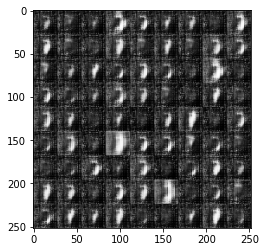

118/118 [==============================] - 14s 117ms/step - loss: -11.5110
Epoch 3/100
117/118 [============================>.] - ETA: 0s - loss: -11.5494

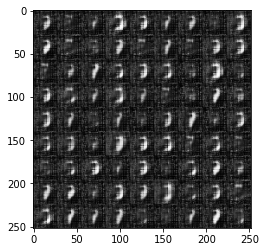

118/118 [==============================] - 14s 118ms/step - loss: -11.5493
Epoch 4/100
117/118 [============================>.] - ETA: 0s - loss: -11.6085

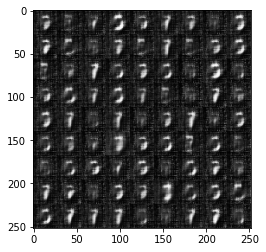

118/118 [==============================] - 14s 117ms/step - loss: -11.6085
Epoch 5/100
117/118 [============================>.] - ETA: 0s - loss: -11.6594

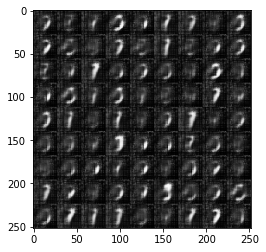

118/118 [==============================] - 14s 116ms/step - loss: -11.6594
Epoch 6/100
117/118 [============================>.] - ETA: 0s - loss: -11.7568

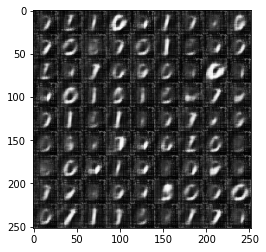

118/118 [==============================] - 14s 116ms/step - loss: -11.7568
Epoch 7/100
117/118 [============================>.] - ETA: 0s - loss: -11.8193

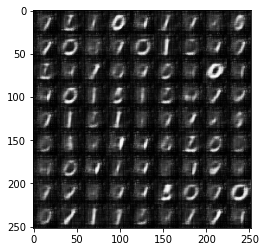

118/118 [==============================] - 14s 116ms/step - loss: -11.8196
Epoch 8/100
117/118 [============================>.] - ETA: 0s - loss: -11.8879

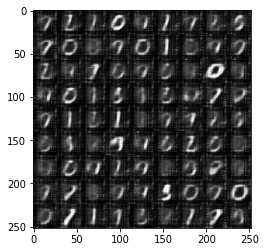

118/118 [==============================] - 14s 116ms/step - loss: -11.8879
Epoch 9/100
117/118 [============================>.] - ETA: 0s - loss: -11.9523

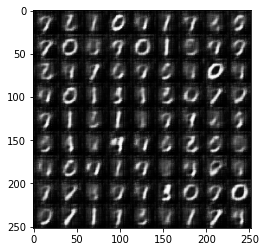

118/118 [==============================] - 14s 117ms/step - loss: -11.9522
Epoch 10/100
117/118 [============================>.] - ETA: 0s - loss: -11.9734

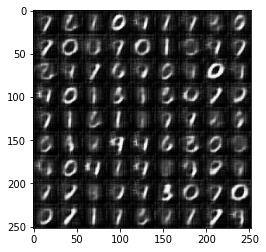

118/118 [==============================] - 14s 116ms/step - loss: -11.9733
Epoch 11/100
117/118 [============================>.] - ETA: 0s - loss: -12.0321

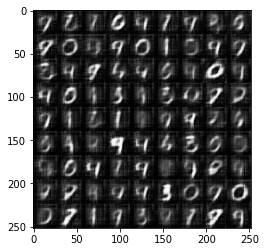

118/118 [==============================] - 14s 116ms/step - loss: -12.0322
Epoch 12/100
117/118 [============================>.] - ETA: 0s - loss: -12.0447

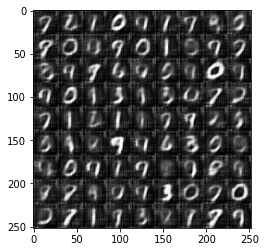

118/118 [==============================] - 14s 116ms/step - loss: -12.0449
Epoch 13/100
117/118 [============================>.] - ETA: 0s - loss: -12.0888

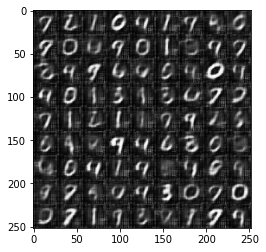

118/118 [==============================] - 14s 116ms/step - loss: -12.0888
Epoch 14/100
117/118 [============================>.] - ETA: 0s - loss: -12.1328

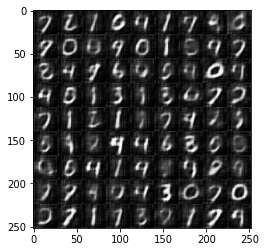

118/118 [==============================] - 14s 116ms/step - loss: -12.1327
Epoch 15/100
117/118 [============================>.] - ETA: 0s - loss: -12.1602

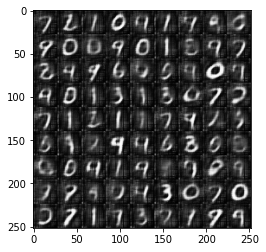

118/118 [==============================] - 14s 116ms/step - loss: -12.1602
Epoch 16/100
117/118 [============================>.] - ETA: 0s - loss: -12.1763

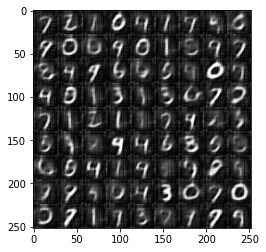

118/118 [==============================] - 14s 116ms/step - loss: -12.1762
Epoch 17/100
117/118 [============================>.] - ETA: 0s - loss: -12.1947

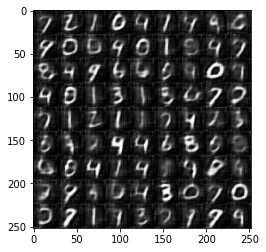

118/118 [==============================] - 14s 116ms/step - loss: -12.1947
Epoch 18/100
117/118 [============================>.] - ETA: 0s - loss: -12.2032

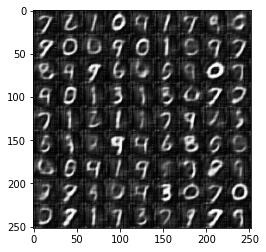

118/118 [==============================] - 14s 117ms/step - loss: -12.2033
Epoch 19/100
117/118 [============================>.] - ETA: 0s - loss: -12.2050

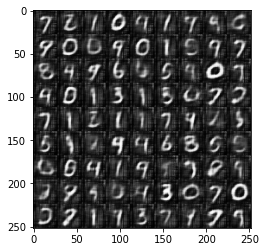

118/118 [==============================] - 14s 116ms/step - loss: -12.2050
Epoch 20/100
117/118 [============================>.] - ETA: 0s - loss: -12.2372

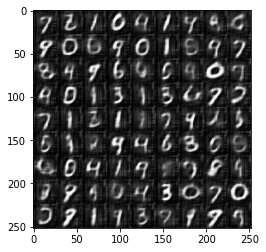

118/118 [==============================] - 14s 116ms/step - loss: -12.2372
Epoch 21/100
117/118 [============================>.] - ETA: 0s - loss: -12.2623

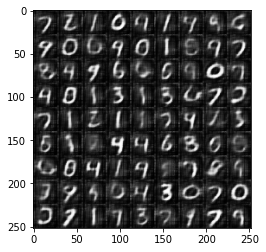

118/118 [==============================] - 14s 117ms/step - loss: -12.2624
Epoch 22/100
117/118 [============================>.] - ETA: 0s - loss: -12.2929

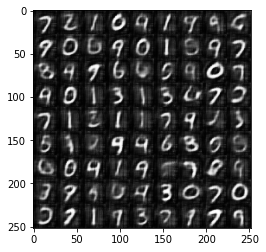

118/118 [==============================] - 14s 117ms/step - loss: -12.2930
Epoch 23/100
117/118 [============================>.] - ETA: 0s - loss: -12.3265

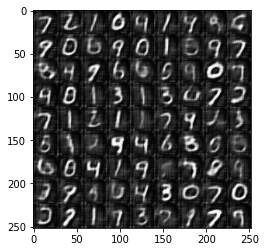

118/118 [==============================] - 14s 116ms/step - loss: -12.3265
Epoch 24/100
117/118 [============================>.] - ETA: 0s - loss: -12.3191

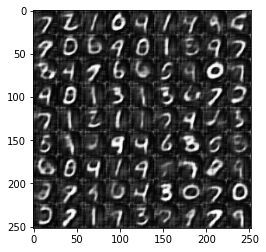

118/118 [==============================] - 14s 117ms/step - loss: -12.3191
Epoch 25/100
117/118 [============================>.] - ETA: 0s - loss: -12.3224

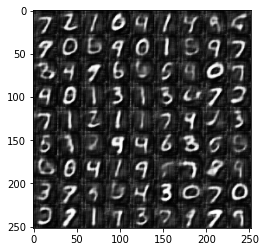

118/118 [==============================] - 14s 116ms/step - loss: -12.3221
Epoch 26/100
117/118 [============================>.] - ETA: 0s - loss: -12.3515

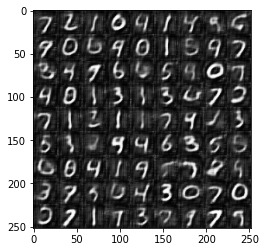

118/118 [==============================] - 14s 116ms/step - loss: -12.3517
Epoch 27/100
117/118 [============================>.] - ETA: 0s - loss: -12.3612

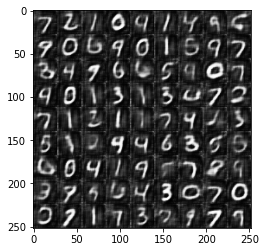

118/118 [==============================] - 14s 116ms/step - loss: -12.3613
Epoch 28/100
117/118 [============================>.] - ETA: 0s - loss: -12.3888

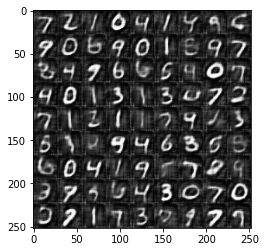

118/118 [==============================] - 14s 116ms/step - loss: -12.3889
Epoch 29/100
117/118 [============================>.] - ETA: 0s - loss: -12.3864

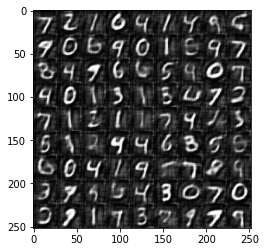

118/118 [==============================] - 14s 116ms/step - loss: -12.3857
Epoch 30/100
117/118 [============================>.] - ETA: 0s - loss: -12.3999

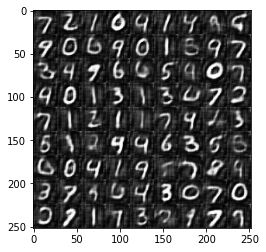

118/118 [==============================] - 14s 116ms/step - loss: -12.3999
Epoch 31/100
117/118 [============================>.] - ETA: 0s - loss: -12.4238

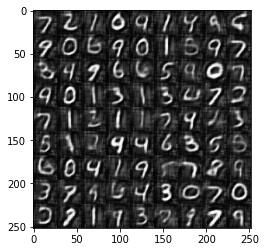

118/118 [==============================] - 14s 116ms/step - loss: -12.4238
Epoch 32/100
117/118 [============================>.] - ETA: 0s - loss: -12.4065

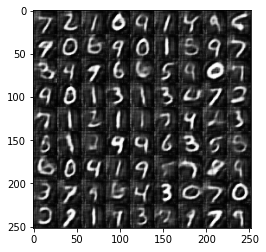

118/118 [==============================] - 14s 116ms/step - loss: -12.4066
Epoch 33/100
117/118 [============================>.] - ETA: 0s - loss: -12.4153

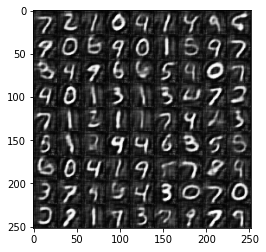

118/118 [==============================] - 14s 116ms/step - loss: -12.4155
Epoch 34/100
117/118 [============================>.] - ETA: 0s - loss: -12.4410

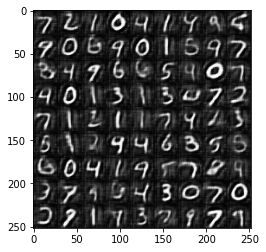

118/118 [==============================] - 14s 116ms/step - loss: -12.4409
Epoch 35/100
117/118 [============================>.] - ETA: 0s - loss: -12.4343

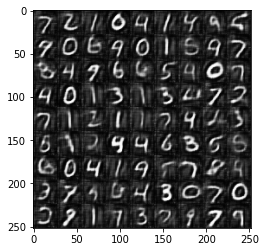

118/118 [==============================] - 14s 116ms/step - loss: -12.4342
Epoch 36/100
117/118 [============================>.] - ETA: 0s - loss: -12.4267

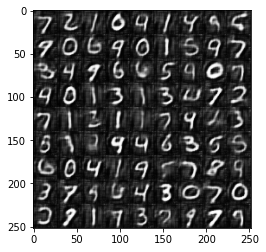

118/118 [==============================] - 14s 118ms/step - loss: -12.4263
Epoch 37/100
117/118 [============================>.] - ETA: 0s - loss: -12.4675

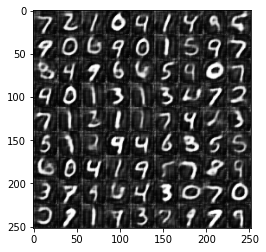

118/118 [==============================] - 14s 116ms/step - loss: -12.4675
Epoch 38/100
117/118 [============================>.] - ETA: 0s - loss: -12.4610

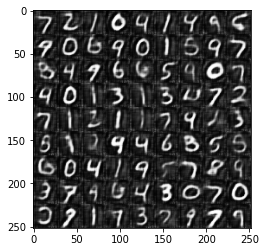

118/118 [==============================] - 14s 116ms/step - loss: -12.4610
Epoch 39/100
117/118 [============================>.] - ETA: 0s - loss: -12.4763

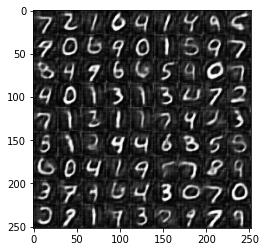

118/118 [==============================] - 14s 116ms/step - loss: -12.4762
Epoch 40/100
117/118 [============================>.] - ETA: 0s - loss: -12.4856

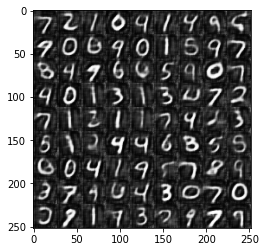

118/118 [==============================] - 14s 116ms/step - loss: -12.4857
Epoch 41/100
117/118 [============================>.] - ETA: 0s - loss: -12.4947

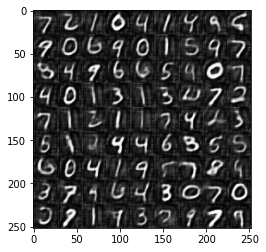

118/118 [==============================] - 14s 116ms/step - loss: -12.4948
Epoch 42/100
117/118 [============================>.] - ETA: 0s - loss: -12.4877

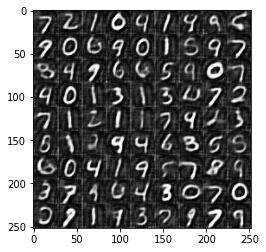

118/118 [==============================] - 14s 116ms/step - loss: -12.4878
Epoch 43/100
117/118 [============================>.] - ETA: 0s - loss: -12.4956

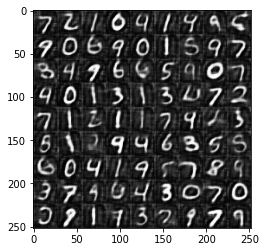

118/118 [==============================] - 14s 116ms/step - loss: -12.4957
Epoch 44/100
117/118 [============================>.] - ETA: 0s - loss: -12.5117

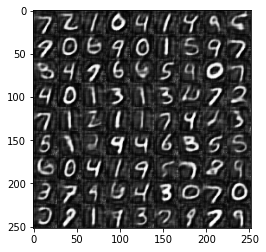

118/118 [==============================] - 14s 116ms/step - loss: -12.5116
Epoch 45/100
117/118 [============================>.] - ETA: 0s - loss: -12.5060

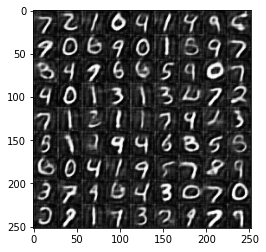

118/118 [==============================] - 14s 117ms/step - loss: -12.5062
Epoch 46/100
117/118 [============================>.] - ETA: 0s - loss: -12.5201

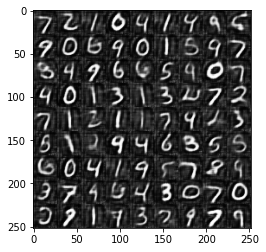

118/118 [==============================] - 14s 117ms/step - loss: -12.5202
Epoch 47/100
117/118 [============================>.] - ETA: 0s - loss: -12.5260

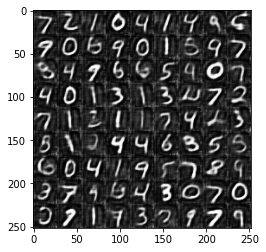

118/118 [==============================] - 14s 116ms/step - loss: -12.5260
Epoch 48/100
117/118 [============================>.] - ETA: 0s - loss: -12.5337

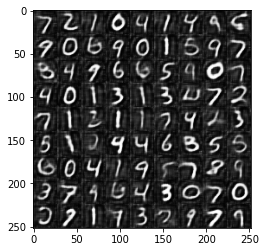

118/118 [==============================] - 14s 116ms/step - loss: -12.5337
Epoch 49/100
117/118 [============================>.] - ETA: 0s - loss: -12.5475

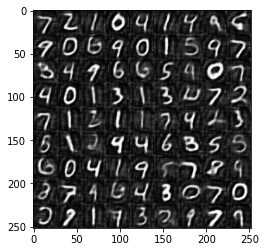

118/118 [==============================] - 14s 116ms/step - loss: -12.5476
Epoch 50/100
117/118 [============================>.] - ETA: 0s - loss: -12.5372

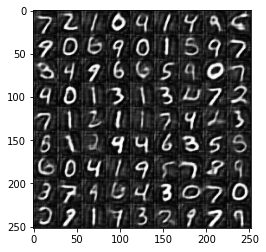

118/118 [==============================] - 14s 116ms/step - loss: -12.5372
Epoch 51/100
117/118 [============================>.] - ETA: 0s - loss: -12.5560

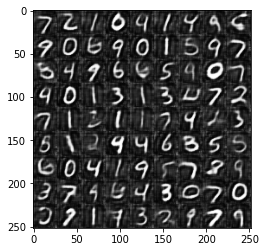

118/118 [==============================] - 14s 116ms/step - loss: -12.5559
Epoch 52/100
117/118 [============================>.] - ETA: 0s - loss: -12.5497

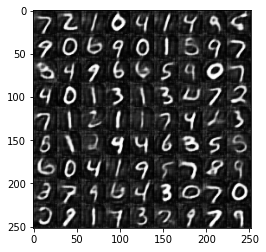

118/118 [==============================] - 14s 117ms/step - loss: -12.5495
Epoch 53/100
117/118 [============================>.] - ETA: 0s - loss: -12.5492

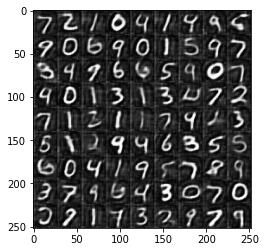

118/118 [==============================] - 14s 117ms/step - loss: -12.5493
Epoch 54/100
117/118 [============================>.] - ETA: 0s - loss: -12.5632

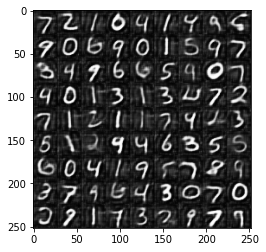

118/118 [==============================] - 14s 116ms/step - loss: -12.5631
Epoch 55/100
117/118 [============================>.] - ETA: 0s - loss: -12.5730

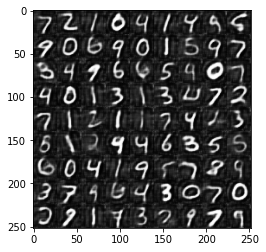

118/118 [==============================] - 14s 116ms/step - loss: -12.5730
Epoch 56/100
117/118 [============================>.] - ETA: 0s - loss: -12.5802

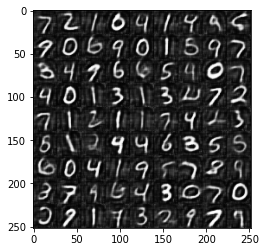

118/118 [==============================] - 14s 116ms/step - loss: -12.5802
Epoch 57/100
117/118 [============================>.] - ETA: 0s - loss: -12.5750

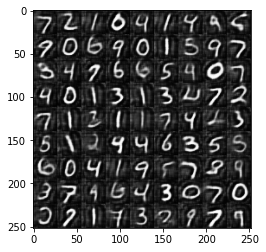

118/118 [==============================] - 14s 116ms/step - loss: -12.5749
Epoch 58/100
117/118 [============================>.] - ETA: 0s - loss: -12.5794

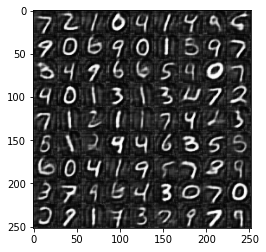

118/118 [==============================] - 14s 117ms/step - loss: -12.5794
Epoch 59/100
117/118 [============================>.] - ETA: 0s - loss: -12.5742

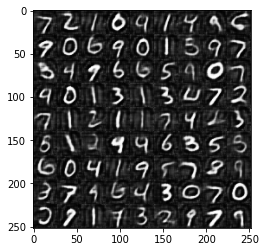

118/118 [==============================] - 14s 117ms/step - loss: -12.5741
Epoch 60/100
117/118 [============================>.] - ETA: 0s - loss: -12.5850

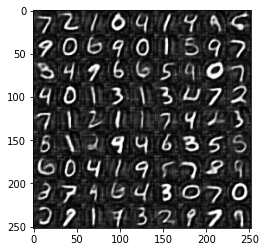

118/118 [==============================] - 14s 116ms/step - loss: -12.5850
Epoch 61/100
117/118 [============================>.] - ETA: 0s - loss: -12.5986

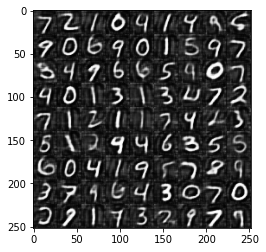

118/118 [==============================] - 14s 116ms/step - loss: -12.5986
Epoch 62/100
117/118 [============================>.] - ETA: 0s - loss: -12.5905

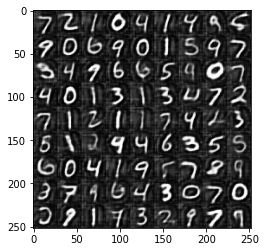

118/118 [==============================] - 14s 116ms/step - loss: -12.5904
Epoch 63/100
117/118 [============================>.] - ETA: 0s - loss: -12.5958

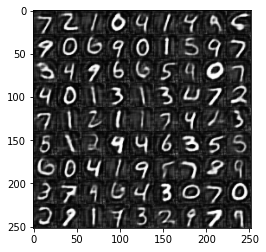

118/118 [==============================] - 14s 116ms/step - loss: -12.5957
Epoch 64/100
117/118 [============================>.] - ETA: 0s - loss: -12.5983

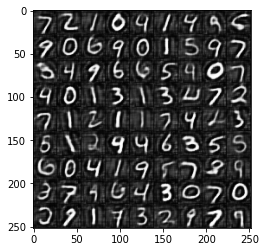

118/118 [==============================] - 14s 116ms/step - loss: -12.5984
Epoch 65/100
117/118 [============================>.] - ETA: 0s - loss: -12.5970

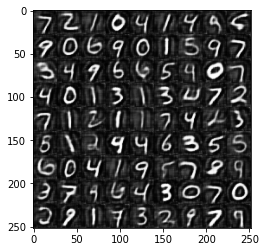

118/118 [==============================] - 14s 116ms/step - loss: -12.5969
Epoch 66/100
117/118 [============================>.] - ETA: 0s - loss: -12.6089

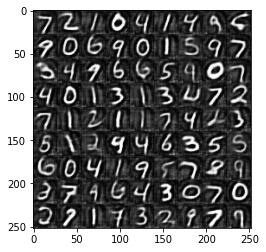

118/118 [==============================] - 14s 116ms/step - loss: -12.6089
Epoch 67/100
117/118 [============================>.] - ETA: 0s - loss: -12.6199

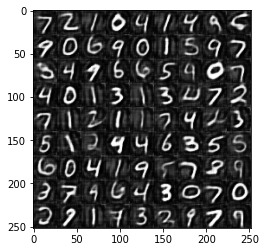

118/118 [==============================] - 14s 116ms/step - loss: -12.6199
Epoch 68/100
117/118 [============================>.] - ETA: 0s - loss: -12.6106

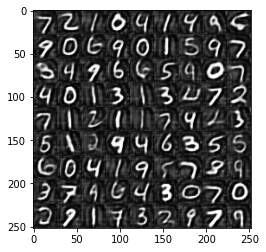

118/118 [==============================] - 14s 116ms/step - loss: -12.6105
Epoch 69/100
117/118 [============================>.] - ETA: 0s - loss: -12.6189

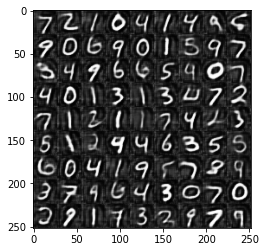

118/118 [==============================] - 14s 117ms/step - loss: -12.6187
Epoch 70/100
117/118 [============================>.] - ETA: 0s - loss: -12.6230

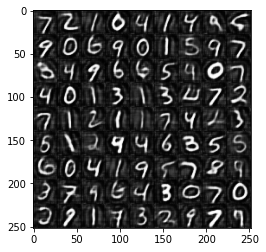

118/118 [==============================] - 14s 116ms/step - loss: -12.6231
Epoch 71/100
117/118 [============================>.] - ETA: 0s - loss: -12.6282

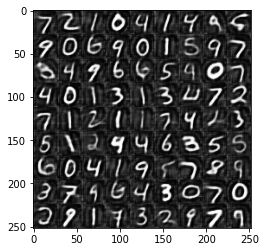

118/118 [==============================] - 14s 117ms/step - loss: -12.6283
Epoch 72/100
117/118 [============================>.] - ETA: 0s - loss: -12.6225

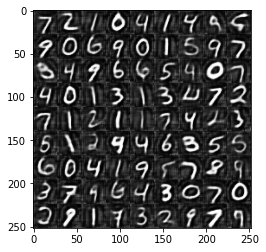

118/118 [==============================] - 14s 116ms/step - loss: -12.6225
Epoch 73/100
117/118 [============================>.] - ETA: 0s - loss: -12.6215

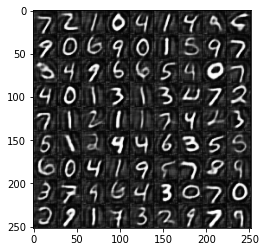

118/118 [==============================] - 14s 116ms/step - loss: -12.6217
Epoch 74/100
117/118 [============================>.] - ETA: 0s - loss: -12.6313

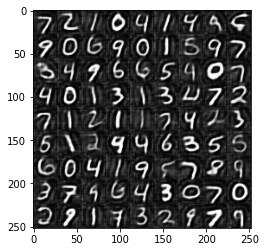

118/118 [==============================] - 14s 117ms/step - loss: -12.6312
Epoch 75/100
117/118 [============================>.] - ETA: 0s - loss: -12.6348

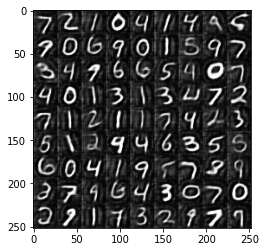

118/118 [==============================] - 14s 116ms/step - loss: -12.6348
Epoch 76/100
117/118 [============================>.] - ETA: 0s - loss: -12.6349

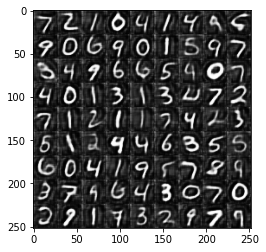

118/118 [==============================] - 14s 116ms/step - loss: -12.6350
Epoch 77/100
117/118 [============================>.] - ETA: 0s - loss: -12.6375

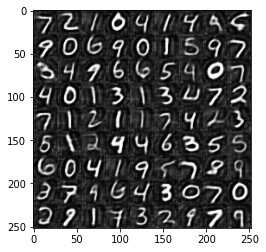

118/118 [==============================] - 14s 116ms/step - loss: -12.6375
Epoch 78/100
117/118 [============================>.] - ETA: 0s - loss: -12.6426

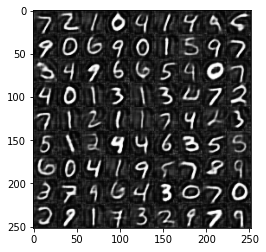

118/118 [==============================] - 14s 116ms/step - loss: -12.6426
Epoch 79/100
117/118 [============================>.] - ETA: 0s - loss: -12.6448

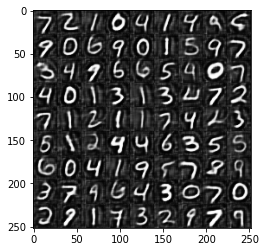

118/118 [==============================] - 14s 116ms/step - loss: -12.6446
Epoch 80/100
117/118 [============================>.] - ETA: 0s - loss: -12.6462

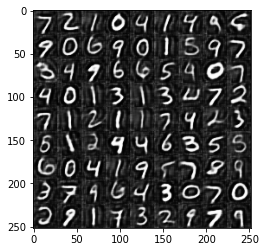

118/118 [==============================] - 14s 116ms/step - loss: -12.6465
Epoch 81/100
117/118 [============================>.] - ETA: 0s - loss: -12.6454

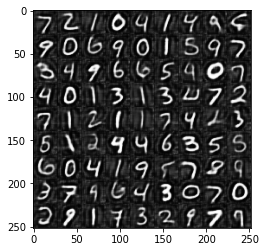

118/118 [==============================] - 14s 116ms/step - loss: -12.6456
Epoch 82/100
117/118 [============================>.] - ETA: 0s - loss: -12.6484

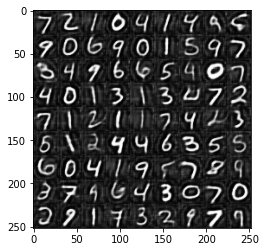

118/118 [==============================] - 14s 116ms/step - loss: -12.6484
Epoch 83/100
117/118 [============================>.] - ETA: 0s - loss: -12.6536

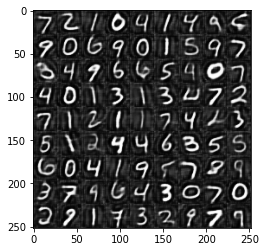

118/118 [==============================] - 14s 116ms/step - loss: -12.6535
Epoch 84/100
117/118 [============================>.] - ETA: 0s - loss: -12.6627

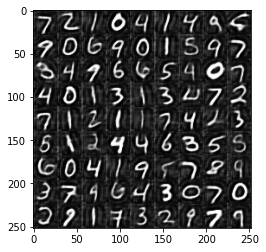

118/118 [==============================] - 14s 116ms/step - loss: -12.6624
Epoch 85/100
117/118 [============================>.] - ETA: 0s - loss: -12.6654

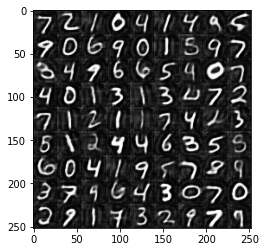

118/118 [==============================] - 14s 116ms/step - loss: -12.6655
Epoch 86/100
117/118 [============================>.] - ETA: 0s - loss: -12.6634

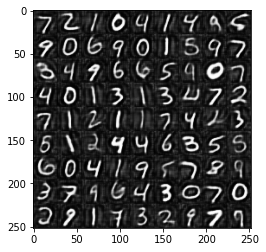

118/118 [==============================] - 14s 116ms/step - loss: -12.6632
Epoch 87/100
117/118 [============================>.] - ETA: 0s - loss: -12.6662

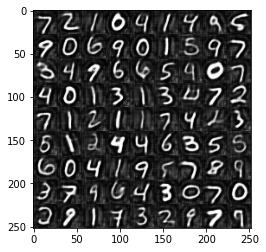

118/118 [==============================] - 14s 118ms/step - loss: -12.6660
Epoch 88/100
117/118 [============================>.] - ETA: 0s - loss: -12.6564

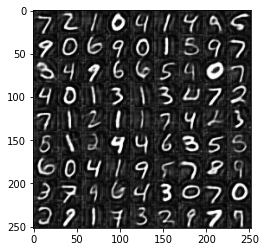

118/118 [==============================] - 14s 116ms/step - loss: -12.6562
Epoch 89/100
117/118 [============================>.] - ETA: 0s - loss: -12.6675

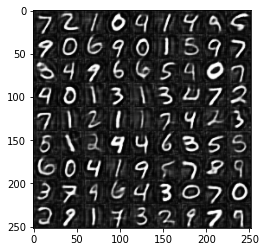

118/118 [==============================] - 14s 116ms/step - loss: -12.6675
Epoch 90/100
117/118 [============================>.] - ETA: 0s - loss: -12.6667

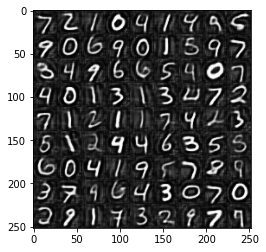

118/118 [==============================] - 14s 116ms/step - loss: -12.6667
Epoch 91/100
117/118 [============================>.] - ETA: 0s - loss: -12.6747

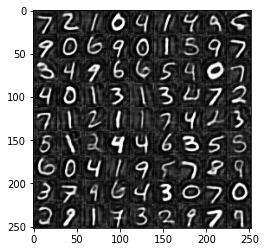

118/118 [==============================] - 14s 116ms/step - loss: -12.6747
Epoch 92/100
117/118 [============================>.] - ETA: 0s - loss: -12.6688

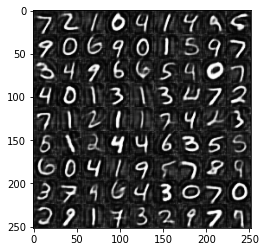

118/118 [==============================] - 14s 116ms/step - loss: -12.6686
Epoch 93/100
117/118 [============================>.] - ETA: 0s - loss: -12.6716

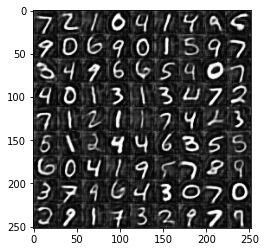

118/118 [==============================] - 14s 116ms/step - loss: -12.6715
Epoch 94/100
117/118 [============================>.] - ETA: 0s - loss: -12.6752

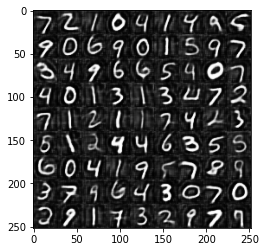

118/118 [==============================] - 14s 116ms/step - loss: -12.6750
Epoch 95/100
117/118 [============================>.] - ETA: 0s - loss: -12.6729

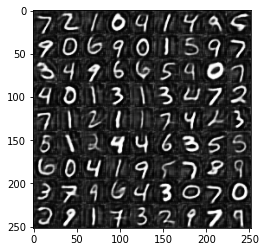

118/118 [==============================] - 14s 116ms/step - loss: -12.6729
Epoch 96/100
117/118 [============================>.] - ETA: 0s - loss: -12.6742

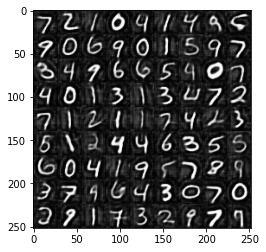

118/118 [==============================] - 14s 117ms/step - loss: -12.6743
Epoch 97/100
117/118 [============================>.] - ETA: 0s - loss: -12.6781

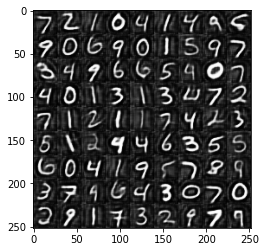

118/118 [==============================] - 14s 116ms/step - loss: -12.6781
Epoch 98/100
117/118 [============================>.] - ETA: 0s - loss: -12.6846

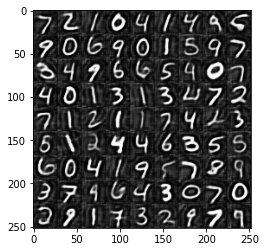

118/118 [==============================] - 14s 116ms/step - loss: -12.6844
Epoch 99/100
117/118 [============================>.] - ETA: 0s - loss: -12.6892

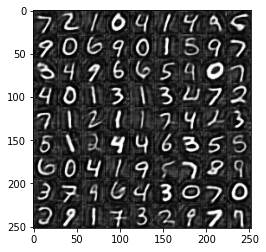

118/118 [==============================] - 14s 116ms/step - loss: -12.6893
Epoch 100/100
117/118 [============================>.] - ETA: 0s - loss: -12.6746

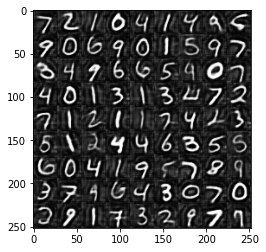

118/118 [==============================] - 14s 116ms/step - loss: -12.6745


In [97]:
optimizer = keras.optimizers.Adam(learning_rate=0.0002, beta_1=0.5, beta_2=0.9)


lamda = 1.0.

def loss_function(real_img, fake_img):
    r_loss = tf.reduce_mean(keras.losses.mean_squared_error(real_img, fake_img))
    d_loss = - tf.reduce_mean(d_model(fake_img)) # real:1, fake:0
    return (1-lamda)*r_loss + lamda*d_loss




ae_model.compile(optimizer=optimizer, loss="binary_crossentropy")


iad_monintor = IadMonitor(81, test_images)

epochs = 100

train_data = train_images
ae_model.fit(train_data, train_data, epochs=epochs, batch_size=BATCH_SIZE, callbacks=[iad_monintor])


In [ ]:
optimizer = keras.optimizers.Adam(learning_rate=0.0002, beta_1=0.5, beta_2=0.9)


lamda = 0.9

def loss_function(real_img, fake_img):
    r_loss = tf.reduce_mean(keras.losses.mean_squared_error(real_img, fake_img))
    d_loss = - tf.reduce_mean(d_model(fake_img)) # real:1, fake:0
    return (1-lamda)*r_loss + lamda*d_loss



ae_model.compile(optimizer=optimizer, loss="binary_crossentropy")


iad_monintor = IadMonitor(81, test_images)

epochs = 100

train_data = train_images
ae_model.fit(train_data, train_data, epochs=epochs, batch_size=BATCH_SIZE, callbacks=[iad_monintor])


In [ ]:
optimizer = keras.optimizers.Adam(learning_rate=0.0002, beta_1=0.5, beta_2=0.9)


lamda = 0.5

def loss_function(real_img, fake_img):
    r_loss = tf.reduce_mean(keras.losses.mean_squared_error(real_img, fake_img))
    d_loss = - tf.reduce_mean(d_model(fake_img)) # real:1, fake:0
    return (1-lamda)*r_loss + lamda*d_loss




ae_model.compile(optimizer=optimizer, loss="binary_crossentropy")


iad_monintor = IadMonitor(81, test_images)

epochs = 100

train_data = train_images
ae_model.fit(train_data, train_data, epochs=epochs, batch_size=BATCH_SIZE, callbacks=[iad_monintor])


# 요 아래는 가비지

시도 했었던 코드, 완료가 안되고 뻑나는 상태이다. 

In [79]:
class IncrementalAnomalyDetector(keras.Model):
    def __init__(
        self,
        autoencoder,
    ):
        super(IncrementalAnomalyDetector, self).__init__()
        self.autoencoder = autoencoder

    def compile(self, optimizer, loss):
        super(IncrementalAnomalyDetector, self).compile()
        self.optimizer = optimizer
        self.loss=loss

    def train_step(self, real_images):
        with tf.GradientTape() as tape:
            generated_images = self.autoencoder(real_images, training=True)

        loss = self.loss(real_images, generated_images)
        gradient = tape.gradient(loss, self.autoencoder.trainable_variables)
        print("DEV : gradient=", gradient)
        self.optimizer.apply_gradients(zip(gradient, self.autoencoder.trainable_variables))
        print("DEV : self.autoencoder.trainable_variables=", self.autoencoder.trainable_variables)

        return {'loss':loss}   

In [80]:
optimizer = keras.optimizers.Adam(learning_rate=0.0002, beta_1=0.5, beta_2=0.9)


lamda = 0.5

def loss_function(real_img, fake_img):
    r_loss = tf.reduce_mean(keras.losses.mean_squared_error(real_img, fake_img))
    print(r_loss)
    return r_loss
    d_loss = tf.reduce_mean(d_model(fake_img))
    return lamda*r_loss + (1-lamda)*d_loss


epochs = 20


# Get the wgan model
iad = IncrementalAnomalyDetector(
    autoencoder=ae_model,
)


# Compile the wgan model
iad.compile(
    optimizer=optimizer,
    loss=loss_function,
)


# monitor_callback = IadMonitor(num_img=81, latent_dim=noise_dim)

# Start training
iad.fit(train_images, batch_size=BATCH_SIZE, epochs=epochs)


Epoch 1/20
Tensor("Mean_1:0", shape=(), dtype=float32)
DEV : gradient= [None, None, None, None, None, None, None, None, None, None, None, None, None, None, None, None, None, None, None]


ValueError: ignored